# CAPSTONE PROJECT: GENRE CLASSIFICATION 

### Modeling & Hyperparameter Optimization 
Stephanie Barrett | September 5, 2023

This project aims to use machine learning to classify songs into the correct genre based on particular attributes. 

**Introduction:** This is notebook 4 of 4 that was used in the genre classification project. After using classifiers on a large dataset of spotify songs containing 85 genres *and* on a smaller dataset containing 8 distinct genres, we discovered that it is quite difficult to classify songs into their appropriate genre based on our given attributes. The purpose of this notebook is to see if we can cluster songs in an unsupervised manner. After running a k-means, we can add back on the cluster labels and the genre labels to see if there are any trends within the identified clusters. The reason we decided to start with the dataset containing the larger number of genres (85) is because it is more representative of a song library that may exist on any streaming platform. We want to see if, given a large number of genres and subgenres, we can cluster songs based on our features.
***
**TABLE OF CONTENTS**

[Introduction](#Modeling-&-Hyperparameter-Optimization)

[Loading and Checking our Cleaned Data](#LOADING-AND-CLEANING-DATA)

[Creating Unlabeled DataFrame for Unsupervised Learning](#CREATING-UNLABELED-DATAFRAME-FOR-UNSUPERVISED-LEARNING)

[Scaling the Unlabeled Data](#SCALING-THE-UNLABELED-DATA)

[Dimension Reduction of Scaled Data](#DIMENSION-REDUCTION-OF-SCALED-DATA)

[PCA - 3 Principal Components](#PCA---3-PRINCIPAL-COMPONENTS) 

[K-Means](#KMEANS) 

[Conclusions & Next Steps](#CONCLUSIONS-AND-NEXT-STEPS)

***


### LOADING & CLEANING DATA 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

/Users/stephaniebarrett/opt/anaconda3/envs/bigdata_ml/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Reading in our 85-genre 
df = pd.read_csv('~/Desktop/CapstoneProject/data/consolidated_spotify_updated.csv')

In [3]:
df.shape

(59721, 21)

In [4]:
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,0,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,0,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,0,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,0,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,0,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [5]:
# Setting column 1 as the index 
df = pd.read_csv('~/Desktop/CapstoneProject/data/consolidated_spotify_updated.csv', index_col=0)

In [6]:
df.head(1)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,0,0.676,0.461,1,-6.746,0,0.143,0.0322,0.000001,0.358,0.715,87.917,4,acoustic


In [7]:
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns')

There are 59721 rows and 20 columns


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59721 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          59721 non-null  object 
 1   artists           59721 non-null  object 
 2   album_name        59721 non-null  object 
 3   track_name        59721 non-null  object 
 4   popularity        59721 non-null  int64  
 5   duration_ms       59721 non-null  int64  
 6   explicit          59721 non-null  int64  
 7   danceability      59721 non-null  float64
 8   energy            59721 non-null  float64
 9   key               59721 non-null  int64  
 10  loudness          59721 non-null  float64
 11  mode              59721 non-null  int64  
 12  speechiness       59721 non-null  float64
 13  acousticness      59721 non-null  float64
 14  instrumentalness  59721 non-null  float64
 15  liveness          59721 non-null  float64
 16  valence           59721 non-null  float

This data was already cleaned, so there are no missing values and each column has the correct data type. 

In [9]:
# Checking the number of unique genres 
df['track_genre'].nunique()

85

In [10]:
# Let's remove the popularity column since it isn't one of our attributes 
df.drop('popularity', axis=1, inplace=True)

In [11]:
df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'duration_ms',
       'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

### CREATING UNLABELED DATAFRAME FOR UNSUPERVISED LEARNING

In [12]:
# dataframe without genre labels
df_unlabeled = df.select_dtypes(exclude='object')

In [13]:
df_unlabeled 

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4
1,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4
2,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4
3,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3
4,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5
113996,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4
113997,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4
113998,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4


In [14]:
# Double checknig data types 
df_unlabeled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59721 entries, 0 to 113999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   duration_ms       59721 non-null  int64  
 1   explicit          59721 non-null  int64  
 2   danceability      59721 non-null  float64
 3   energy            59721 non-null  float64
 4   key               59721 non-null  int64  
 5   loudness          59721 non-null  float64
 6   mode              59721 non-null  int64  
 7   speechiness       59721 non-null  float64
 8   acousticness      59721 non-null  float64
 9   instrumentalness  59721 non-null  float64
 10  liveness          59721 non-null  float64
 11  valence           59721 non-null  float64
 12  tempo             59721 non-null  float64
 13  time_signature    59721 non-null  int64  
dtypes: float64(9), int64(5)
memory usage: 6.8 MB


We can see from our glance at the data that we have 59,721 but our last row index is 113,999. Let's reset the index. 

In [15]:
# Resetting index 
df_unlabeled.reset_index(drop=True, inplace=True)

In [16]:
# Sanity check 
df_unlabeled.index

RangeIndex(start=0, stop=59721, step=1)

### SCALING THE UNLABELED DATA

Let's use two different scalers and two different dimension reduction objects so that we can plot our dimensions and look for potential clusters. We can choose the the scaler and dimension reduction that shows the most potential for any separation in the data. 

In [17]:
# Scaling the data
from sklearn.preprocessing import StandardScaler, MinMaxScaler

ss = StandardScaler()
mm = MinMaxScaler()
df_ss = ss.fit_transform(df_unlabeled)

df_mm = mm.fit_transform(df_unlabeled)

In [18]:
df_ss

array([[-0.06416899, -0.28820096,  0.70762711, ...,  0.93057826,
        -1.23426918,  0.20719682],
       [-0.75877388, -0.28820096, -0.798958  , ..., -0.78201636,
        -1.59283456,  0.20719682],
       [-0.23418677, -0.28820096, -0.69302624, ..., -1.34396147,
        -1.63261785,  0.20719682],
       ...,
       [ 0.28546435, -0.28820096,  0.4310275 , ...,  1.03761542,
         0.29451634,  0.20719682],
       [ 0.39195684, -0.28820096,  0.18385338, ..., -0.22389401,
         0.41768293,  0.20719682],
       [ 0.03146601, -0.28820096, -0.17513761, ...,  0.90381897,
        -1.53407083,  0.20719682]])

In [19]:
# Creating two DataFrames - one scaled using Standard Scaler and one scaled using MinMax scaler
df_mm = pd.DataFrame(df_mm, columns=df_unlabeled.columns, index=df_unlabeled.index)
df_ss = pd.DataFrame(df_ss, columns=df_unlabeled.columns, index=df_unlabeled.index)

In [20]:
# DataFrame of scaled data using MinMax scaler  
df_mm.head()

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0.040847,0.0,0.686294,0.460989,0.090909,0.762943,0.0,0.152290,0.032329,0.000001,0.351607,0.718593,0.361245,0.8
1,0.025318,0.0,0.426396,0.165983,0.090909,0.542470,1.0,0.081257,0.927711,0.000006,0.092048,0.268342,0.318397,0.8
2,0.037046,0.0,0.444670,0.358987,0.000000,0.700137,1.0,0.059318,0.210843,0.000000,0.108207,0.120603,0.313643,0.8
3,0.035342,0.0,0.270051,0.059581,0.000000,0.515565,1.0,0.038658,0.908635,0.000071,0.123356,0.143719,0.746758,0.6
4,0.034752,0.0,0.627411,0.442989,0.181818,0.701251,1.0,0.056017,0.470884,0.000000,0.073767,0.167839,0.492863,0.8


Our MinMax scaler normalizes our data, rescaling all values to be in between 0 and 1. For the values that were features that were already in between 0 and 1, the values did not change. 

In [21]:
# DataFrame of scaled data using standard scaler 
df_ss.head()

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,-0.064169,-0.288201,0.707627,-0.830125,-1.210379,0.263186,-1.320473,0.834480,-0.783053,-0.550338,0.717484,0.930578,-1.234269,0.207197
1,-0.758774,-0.288201,-0.798958,-2.026240,-1.210379,-1.986626,0.757304,-0.015376,1.957473,-0.550324,-0.606531,-0.782016,-1.592835,0.207197
2,-0.234187,-0.288201,-0.693026,-1.243697,-1.491329,-0.377718,0.757304,-0.277851,-0.236669,-0.550341,-0.524102,-1.343961,-1.632618,0.207197
3,-0.310395,-0.288201,-1.705263,-2.457652,-1.491329,-2.261177,0.757304,-0.525036,1.899086,-0.550121,-0.446825,-1.256038,1.991822,-2.322756
4,-0.336789,-0.288201,0.366291,-0.903108,-0.929429,-0.366350,0.757304,-0.317350,0.559246,-0.550341,-0.699778,-1.164292,-0.132853,0.207197


Our standard scaler has rescaled the data so that the mean of the data is centered at zero with the scale as unites of standard deviation from that mean. 

### DIMENSION REDUCTION OF SCALED DATA 

We want to see the potential clusters in our datasets. So, let's plot the principle components against one another. We will choose between different combinations of Standard Scaler and MinMax Scaler with PCA and TSNE based on what we see in the pairplot. 

In [22]:
# PCA and TSNE 
from sklearn.decomposition import PCA 
from sklearn.manifold import TSNE 

# Fitting a PCA to MinMax scaled data and Standard scaled data separately 
pca = PCA() 
df_mm_pca = pca.fit_transform(df_mm)
df_ss_pca = pca.fit_transform(df_ss)

# Fitting a TSNE to MinMax scaled data and Standard scaled data separately 
tsne = TSNE(n_components=3)
df_mm_tsne = tsne.fit_transform(df_mm)
df_ss_tsne = tsne.fit_transform(df_ss)

In [23]:
# How much variance is explained by each principle component 
pca.explained_variance_ratio_

array([0.20366141, 0.11273337, 0.09238027, 0.08817646, 0.07665751,
       0.06964893, 0.06346848, 0.06239817, 0.06031467, 0.05542343,
       0.04862678, 0.03324411, 0.02369597, 0.00957042])

The highest amount of variance we can have explained is 20.4% by principal component 1. 

By default, the n_component parameter of a PCA will use the number of features you have in your dataset. That's why we have 15 ratios - 15 columns in the original dataset. They are listed in the order of which principal component explains the most variance. 

In [24]:
# Temporary, sample DataFrame of our default PCA with values scaled by MinMax scaler 
df_sample = pd.DataFrame(df_mm_pca, index=df.index)

In [25]:
df_sample.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.553472,-0.060249,-0.212876,-0.520152,-0.162339,0.041936,0.007443,0.290959,0.247948,0.083023,0.087399,0.007106,-0.096581,0.001907
1,-0.621617,0.696961,-0.260948,-0.331973,0.111446,-0.168982,-0.127985,0.020193,0.019200,0.123160,0.062142,-0.045773,0.050007,-0.013223
2,-0.473274,0.113494,0.112709,-0.408188,0.120203,-0.349959,-0.254710,0.183371,0.134487,0.140040,0.027433,-0.030999,-0.044420,-0.007152
3,-0.651159,0.767222,-0.175163,-0.414413,0.168819,-0.327215,-0.100013,-0.126129,0.179934,-0.270549,-0.022103,0.123171,0.047822,-0.005233
4,-0.471768,0.205742,-0.035315,-0.236980,0.086710,-0.224643,-0.235384,0.117477,-0.098699,-0.052094,-0.011127,-0.021778,0.005948,-0.009740


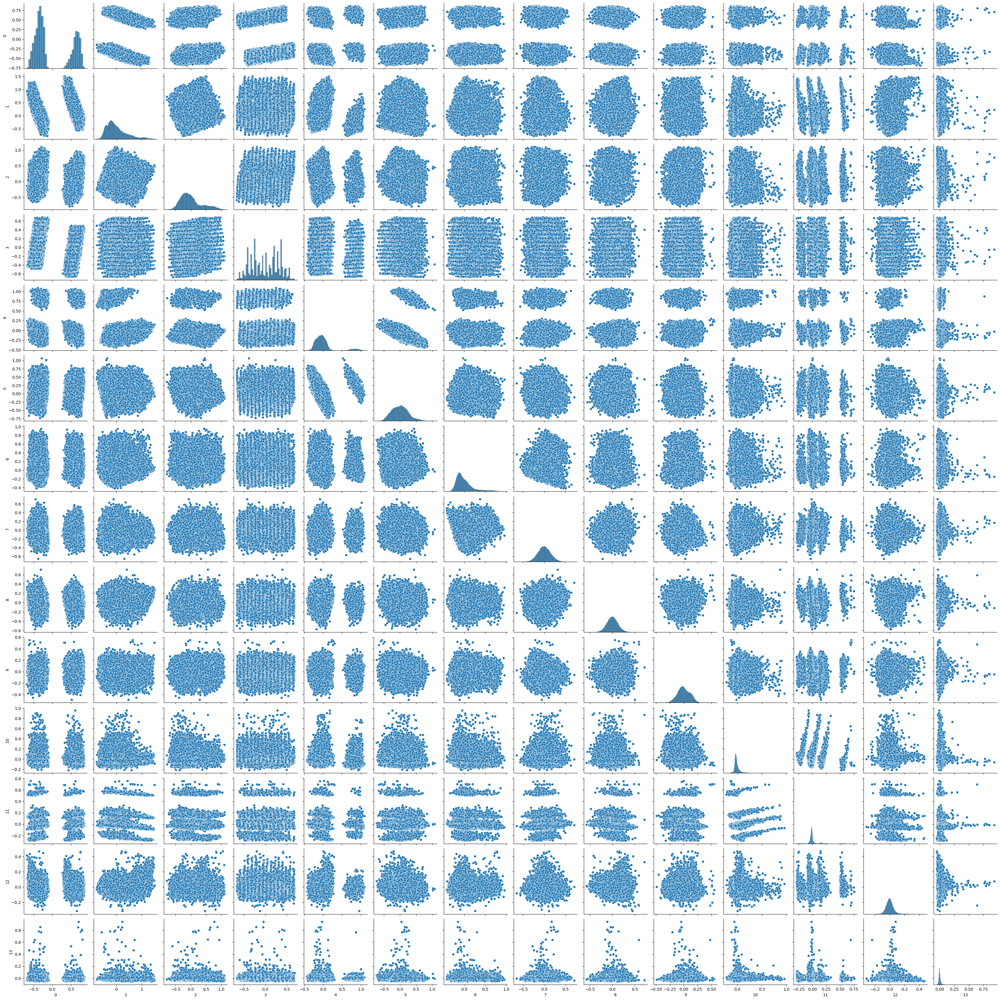

In [26]:
# Visualizing default PCA with MinMax Scaler 
sns.pairplot(pd.DataFrame(df_mm_pca))

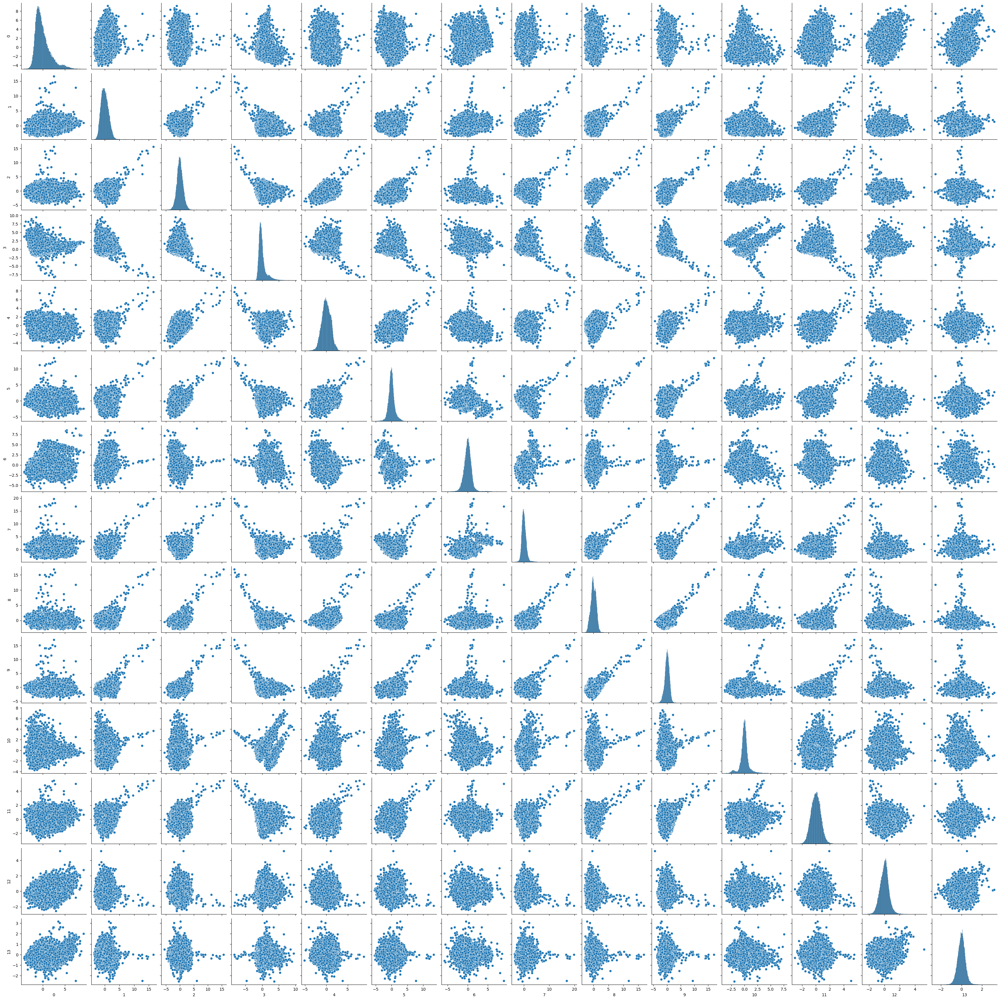

In [27]:
# PCA Standard Scaler 
sns.pairplot(pd.DataFrame(df_ss_pca))

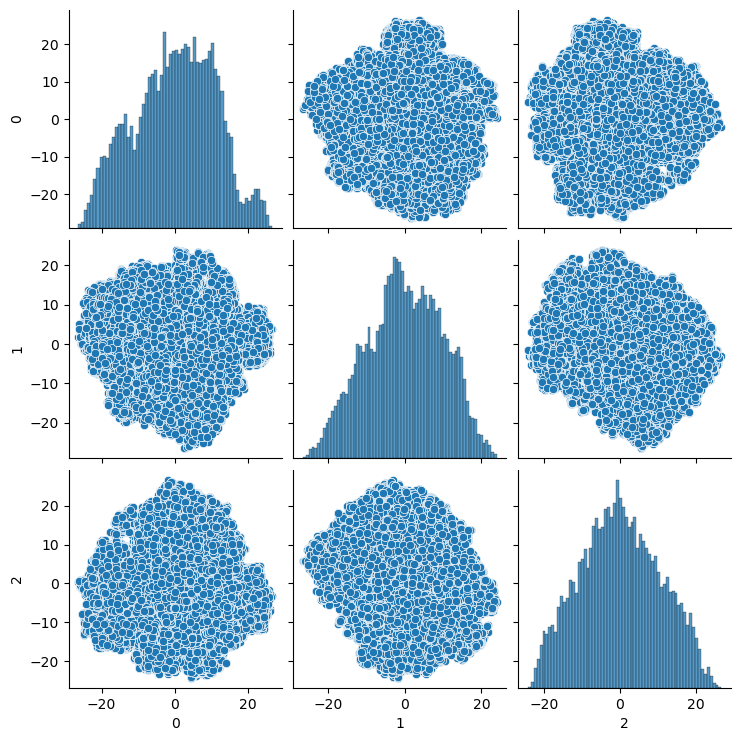

In [28]:
sns.pairplot(pd.DataFrame(df_ss_tsne))

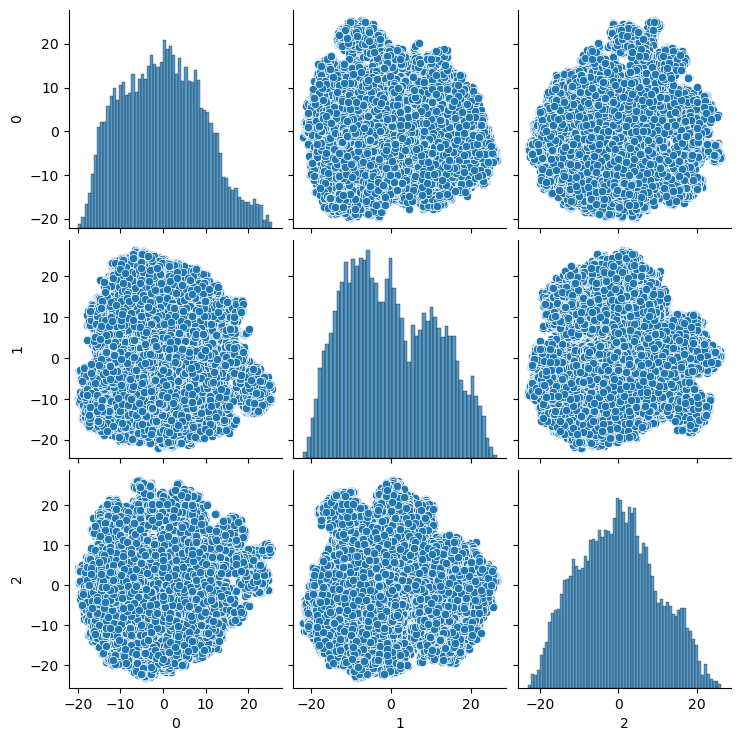

In [29]:
sns.pairplot(pd.DataFrame(df_mm_tsne))

Based on the the visualizations above, we will use the combination of MinMax Scaler and PCA going forward based on the potential for clustering. We can use the above visual to choose the value for n_components, but let's instead add back in our labels and choose our n_component value based on a scree plot of the variance. 


In [30]:
cluster_df = pd.DataFrame(df_mm_pca)

In [31]:
cluster_df 

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.553472,-0.060249,-0.212876,-0.520152,-0.162339,0.041936,0.007443,0.290959,0.247948,0.083023,0.087399,0.007106,-0.096581,0.001907
1,-0.621617,0.696961,-0.260948,-0.331973,0.111446,-0.168982,-0.127985,0.020193,0.019200,0.123160,0.062142,-0.045773,0.050007,-0.013223
2,-0.473274,0.113494,0.112709,-0.408188,0.120203,-0.349959,-0.254710,0.183371,0.134487,0.140040,0.027433,-0.030999,-0.044420,-0.007152
3,-0.651159,0.767222,-0.175163,-0.414413,0.168819,-0.327215,-0.100013,-0.126129,0.179934,-0.270549,-0.022103,0.123171,0.047822,-0.005233
4,-0.471768,0.205742,-0.035315,-0.236980,0.086710,-0.224643,-0.235384,0.117477,-0.098699,-0.052094,-0.011127,-0.021778,0.005948,-0.009740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59716,-0.448759,0.813845,0.667329,0.141150,0.108305,-0.015729,-0.014072,-0.136236,0.141080,-0.009910,0.062868,-0.268748,-0.038860,0.020690
59717,0.344375,1.358894,0.493293,-0.484247,0.093478,0.028808,0.072619,-0.158693,0.076618,0.134145,0.032575,-0.080052,-0.040043,0.023588
59718,0.361091,0.603254,-0.531964,-0.617048,-0.143198,0.183561,-0.070051,-0.089144,0.003759,-0.066745,-0.020522,-0.033875,-0.021636,0.013759
59719,-0.372644,0.045184,-0.153903,0.200301,-0.001214,-0.128532,-0.026353,0.103086,0.032914,-0.087935,-0.035449,-0.027135,0.033935,0.007058


In [32]:
# Already has PCA applied. Let's look at a scree plot to decide the appropriate number of n_components 
cluster_explained_var = pca.explained_variance_ratio_

In [33]:
cluster_explained_var

array([0.20366141, 0.11273337, 0.09238027, 0.08817646, 0.07665751,
       0.06964893, 0.06346848, 0.06239817, 0.06031467, 0.05542343,
       0.04862678, 0.03324411, 0.02369597, 0.00957042])

We'll use the above variance ratios from the pca for our scree plot. The scree plot should be able to tell us how many n_components we should use for our PCA(). 

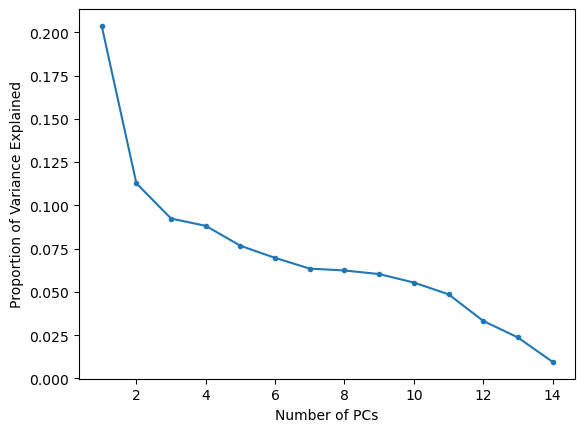

In [34]:
plt.figure()
plt.plot(range(1,15), cluster_explained_var, marker='.')
plt.xlabel('Number of PCs')
plt.ylabel('Proportion of Variance Explained')
plt.show()


Either 3 or 7 PCs seem possible. Let's refer back to the visualation of the PCA with the default number  of n_components. The last number of components with separable clusters was 12. Let's try 3 components.  

### PCA - 3 PRINCIPAL COMPONENTS

The scree plot above is a little difficult to interpret, but let's try n_component=3 since that is the first time we see a number of PCs followed by a significant diminishing return in our scree plot. 

In [43]:
# PCA with n_components=3
pca_3 = PCA(n_components=3)
df_mm_copy = df_mm.copy() # making a copy of df_mm_pca
df_mm_pca_3 = pca_3.fit_transform(df_mm_copy) # fitting pca w/ 3 components to our copied df

In [44]:
# Percentage of variance explained by each principal component
pca_3.explained_variance_ratio_

array([0.28310355, 0.18516668, 0.13544937])

We can see an increase in the amount of variance explained by each principal component when we only have 3. 

Let's look at the loadings of each PC. These loadings give us a ratio of how much each feature contributes to a particular PC. These are ratios so they all lie between -1 and 1. The closer each value is to 1 or -1, the more positively or negatively correlated each feature is with the PC. Which variables give the greatest contribution to the PC. 

In [45]:
# Loadings
pca_3.components_

array([[ 0.00241299,  0.03549957,  0.03727789,  0.12233868,  0.17231291,
         0.03109154, -0.95529537,  0.01789064, -0.18803778,  0.05637052,
        -0.00541597, -0.00351892,  0.01112611,  0.01041503],
       [ 0.00197245, -0.14849317, -0.10356662, -0.51576968, -0.00626921,
        -0.18627466, -0.19897405, -0.04230307,  0.6801068 ,  0.31368736,
        -0.0661898 , -0.23084873, -0.06985596, -0.03983231],
       [ 0.01398757, -0.05185552, -0.12674226,  0.1568952 , -0.13336105,
        -0.02223289,  0.11226487, -0.00970539, -0.38633126,  0.77856937,
        -0.03945048, -0.40960306,  0.02611367, -0.00485175]])

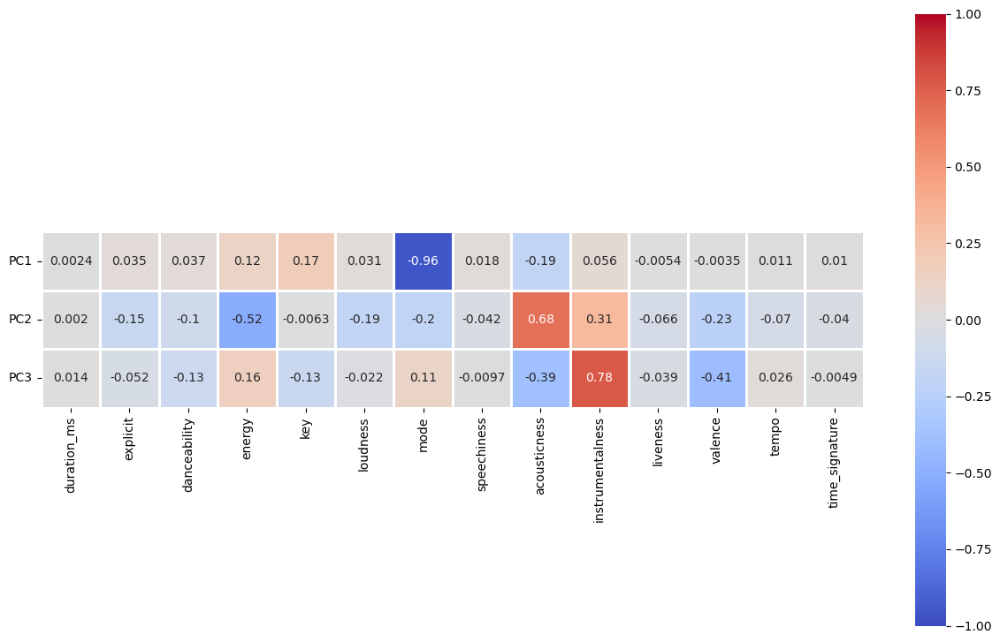

In [54]:
# Heatmap of the laodings from our 3 PCs
plt.figure(figsize=(15,9))

ax = sns.heatmap(pca_3.components_,
                 cmap='coolwarm',
                 yticklabels=[ "PC"+str(x) for x in range(1,pca_3.n_components_+1)],
                 xticklabels=list(df_mm.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-1,
                 vmax=1,
                 cbar_kws={"orientation": "vertical"})

plt.yticks(rotation=0)
plt.xticks(rotation=90)
ax.set_aspect("equal")

Based on the laodings and heatmap in the above outputs, we can see a strong contribution and negative correlation between PC1 and mode (major or minor) (-0.96). 
 
For PC2, we see a strong positively correlated contribution from acousticness (0.68) and instrumentalness (0.31) and a strong negatively contribution from energy (-0.52).

For PC3, we see a much larger positive contribution from instrumentalness (0.78) and some weaker contributions from valence and acousticness. 

These laodings can be a bit difficult to interpret. It may be possible to eliminate certain features that do not contribute much of anything (value close to 0) to any of the principal components for greater interpretability. 

On the next round of analysis, it might be fruitful to do some feature engineering and create a new column that combines the values from the mode and key columns, assinging a number for each major and minor scale. We could then drop the key and mode columns and replace them with this feature engineered column. 

Let's turn our array of the scaled and PCA-ed into a DataFrame so that we can use it for our k-means in the future.

In [47]:
# Creating a DataFrame of our 3 principal components.
cluster_df_3 = pd.DataFrame(df_mm_pca_3)

In [48]:
# DataFrame containing 3 PCs
cluster_df_3

,0,1,2
0,0.553472,-0.060249,-0.212876
1,-0.621617,0.696961,-0.260948
2,-0.473274,0.113494,0.112709
3,-0.651159,0.767222,-0.175163
4,-0.471768,0.205742,-0.035315
...,...,...,...
59716,-0.448759,0.813845,0.667329
59717,0.344375,1.358894,0.493293
59718,0.361091,0.603254,-0.531964
59719,-0.372644,0.045184,-0.153903


Before we move onto our k-means, let's do the same for our scaled data, but instead using 12 components. We will eventually run k_means separately on each of these DataFrames. 

## KMEANS

Before we fit a K-means classifier, we need to find the best value of `k`, the number of clusters to include. We can either use inertia and/or silhouette score to do this. We can also use the pairplot of the potential clusters from the pca plot to guide our decisions. 

Note that clusters are not the same as classes and there is no guarantee that clustering would find the same groups as we might for class labels that we have in mind. 

In our case, we know that there are 85 genres and that there is also a possibility of 13-17 parent genres. It'll be interesting to see if the optimal number of clusters is close to the number of parent genres we estimated based on research and domain knowledge. Keep in mind there was a lot of overlap of genres within the 85 genres. 

Let's go ahead and visualize the inertia and silhouette coefficients for our scaled data with PCA(n_components=3) and our scaled data with PCA(n_components=13) separately to find the best value of `k`.

### BEST VALUE OF `K` FOR PC=3

#### Looking at Inertia 

In [55]:
from sklearn.cluster import KMeans

In [56]:
# Look over a range of K values
k_range = np.arange(1, 20)

# Instantiate an empty list of inertias
inertia_list = []

# Iterate over ks
for k in k_range:
    
    # Instantiate
    k_means_model = KMeans(n_clusters=k)

    # Fit
    k_means_model.fit(cluster_df_3)
    
    # Get inertia and add to list
    inertia_list.append(k_means_model.inertia_) 

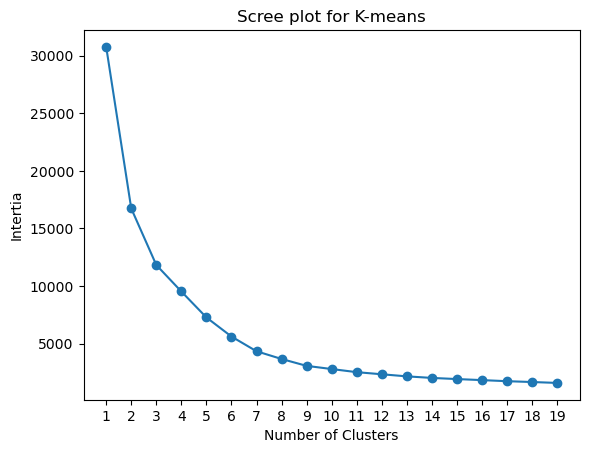

In [57]:
# Visualize intertias vs number of clusters
plt.figure()
plt.plot(k_range, inertia_list, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Intertia')
plt.title('Scree plot for K-means')
plt.xticks(k_range)
plt.show()

Our goal is minimize the inertia. This plot is a little difficult to interpret. Based on inertia, the value of k could be 3, 7, 8 or 9. Let's also check silhouette coefficients to see if we can better interpet the value of k for our k-means.

#### Looking at Silhouette Coefficients 

Our goal is to maximize the silhouette - pick the value of k with the highest silhouette coefficient. 

In [58]:
from sklearn.metrics import silhouette_score

In [59]:
# Look over a range of K values
k_range = np.arange(2, 20)

# Instantiate an empty list of silhouette scores
silhouette_scores = []

# Iterate over ks
for k in k_range:
    
    # Instantiate
    k_means_model = KMeans(n_clusters=k)

    # Fit
    k_means_model.fit(cluster_df_3)
    
    # Get cluster labels and calculate silhouette score
    cluster_labels = k_means_model.predict(cluster_df_3)
    silhouette = silhouette_score(cluster_df_3, cluster_labels)
    
    # Append to list
    silhouette_scores.append(silhouette)

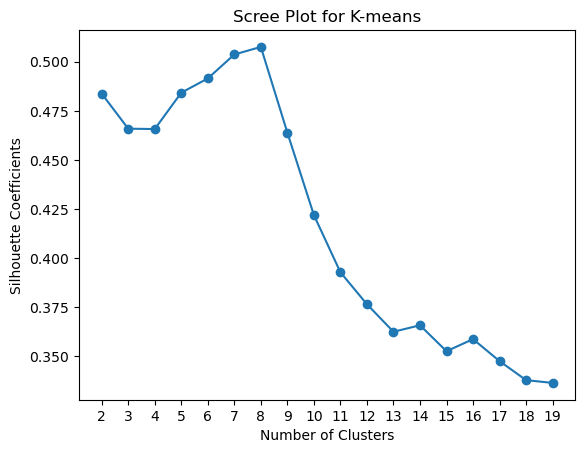

In [60]:
# plot the silhouette 
plt.figure()
plt.plot(k_range, silhouette_scores, marker="o")
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Coefficients')
plt.title('Scree Plot for K-means')
plt.xticks(k_range)
plt.show();

The plot of inertia scores was a little hard to interpret, but looking at the Silhouette coefficients, it looks as though the ideal number of clusters for our scaled, 3-dimensional data set is n_clusters=8. If you remember our PCA pairplot plot at the top of this notebook, there were instances of 8 clusters, but for higher dimensions. The value of 8 also falls within the range of parent genres we saw amongst the 85 genres. 

### K-MEANS FOR CLUSTER_DF_3 - N_CLUSTERS=8

In [71]:
# Instantiate 
k_means_model_2 = KMeans(n_clusters=8)

# Fit 
k_means_model_2.fit(cluster_df_3)

# Get cluster labels
cluster_labels_2 = k_means_model_2.predict(cluster_df_3)

In [72]:
# Our cluster labels 
cluster_labels_2 

array([0, 3, 3, ..., 7, 3, 7], dtype=int32)

In [73]:
# Sanity check the number of rows match our cluster_df_3 
cluster_labels_2.shape

(59721,)

In [74]:
# Adding our cluster labels as a new column 'kmeans_label' in cluster_df_3 
cluster_df_3['kmeans_label'] = cluster_labels_2

In [75]:
cluster_df_3.head()

,0,1,2,kmeans_label
0,0.553472,-0.060249,-0.212876,0
1,-0.621617,0.696961,-0.260948,3
2,-0.473274,0.113494,0.112709,3
3,-0.651159,0.767222,-0.175163,3
4,-0.471768,0.205742,-0.035315,3


In [76]:
cluster_df_3.shape

(59721, 4)

Let's add back in our genre label from our original df. 

In [77]:
genres = df['track_genre']

In [79]:
genres.shape

(59721,)

In [80]:
genres

0            acoustic
1            acoustic
2            acoustic
3            acoustic
4            acoustic
             ...     
113995    world-music
113996    world-music
113997    world-music
113998    world-music
113999    world-music
Name: track_genre, Length: 59721, dtype: object

Notice we have 59,721 rows but the last index of the last genre in the series is 113,999. We need to reset the index of this series before adding it to cluster_df_3. 

In [86]:
# Resetting index in order to add to cluster_df_3 
genres.reset_index(drop=True, inplace=True)

In [87]:
# Sanity check 
genres

0           acoustic
1           acoustic
2           acoustic
3           acoustic
4           acoustic
            ...     
59716    world-music
59717    world-music
59718    world-music
59719    world-music
59720    world-music
Name: track_genre, Length: 59721, dtype: object

In [88]:
# Sanity check - the number of unique genres 
genres.nunique()

85

In [89]:
# Adding genre labels to cluster_df_3 
cluster_df_3['genre'] = genres

In [90]:
# Checking to make sure we have all of our genres 
cluster_df_3['genre'].nunique()

85

In [91]:
# cluster_df_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59721 entries, 0 to 59720
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   0             59721 non-null  float64
 1   1             59721 non-null  float64
 2   2             59721 non-null  float64
 3   kmeans_label  59721 non-null  int32  
 4   genre         59721 non-null  object 
dtypes: float64(3), int32(1), object(1)
memory usage: 2.1+ MB


In [92]:
# Our kmeans_label and genre columns have been added successfully 
cluster_df_3.head()

,0,1,2,kmeans_label,genre
0,0.553472,-0.060249,-0.212876,0,acoustic
1,-0.621617,0.696961,-0.260948,3,acoustic
2,-0.473274,0.113494,0.112709,3,acoustic
3,-0.651159,0.767222,-0.175163,3,acoustic
4,-0.471768,0.205742,-0.035315,3,acoustic


In [93]:
# Double checking the unique values of our clusters
cluster_df_3['kmeans_label'].unique()

array([0, 3, 2, 7, 5, 4, 1, 6], dtype=int32)

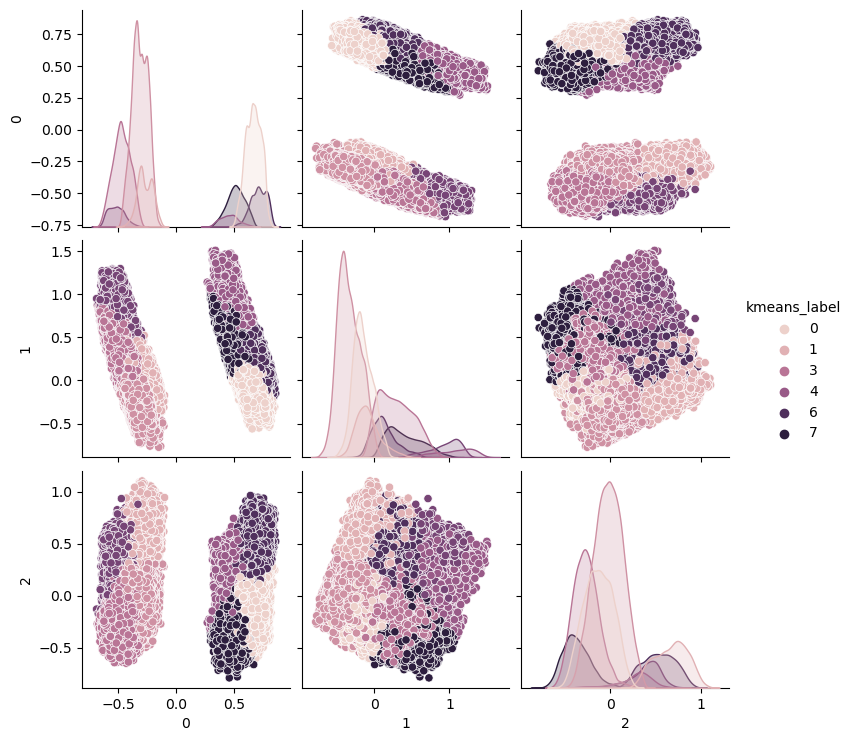

In [94]:
# Visualizing our clusters 
sns.pairplot(cluster_df_3, hue='kmeans_label')

This is showing us all the combinations of our 3 principal components. 

Based on the 2-D pairplot above, we can see that there does seem to be some overlap, but clear separation of these clusters. Let's look at the distribution of genres within these clusters.

#### CLUSTER EVALUATION: 

In [95]:
# Percentage of songs in each cluster 
cluster_df_3['kmeans_label'].value_counts(normalize=True)

2    0.332128
0    0.202324
3    0.183554
1    0.084409
7    0.073592
6    0.066777
5    0.035431
4    0.021785
Name: kmeans_label, dtype: float64

Cluster 2 has the largest percentage of tracks (33.2%). Let's see if there is a particular genre that is making up this cluster.

#### LOOKING AT CLUSTER_2:

In [96]:
cluster_2 = cluster_df_3.loc[cluster_df_3['kmeans_label'] == 2]

In [97]:
# Total number of unique genres in cluster_1 
cluster_2['genre'].nunique()

85

All 85 genres seem to be present in cluster_2. Let's see the percentage of each genre.

In [106]:
# Making cluster_2 into a DataFrame
cluster_2.head()

,0,1,2,kmeans_label,genre
5,-0.369599,-0.068756,-0.229945,2,acoustic
14,-0.359236,-0.284847,0.040191,2,acoustic
15,-0.383941,-0.036513,0.043491,2,acoustic
30,-0.350941,-0.013110,-0.057032,2,acoustic
32,-0.397358,-0.287393,-0.080354,2,acoustic


We can see that a large number of cluster_2 tracks are from acoustic genre. Let's see what percentage of genres exist in this cluster. 

In [115]:
# Top 10 genres in cluster 1 - largest cluster 
cluster_2['genre'].value_counts(normalize=True).head(10)

j-idol              0.029594
power-pop           0.028535
heavy-metal         0.025964
world-music         0.024351
ska                 0.023847
forro               0.022990
reggae_dancehall    0.022939
grunge              0.022385
emo                 0.022082
alt-rock            0.020469
Name: genre, dtype: float64

Based on the fact that we don't see a large percentage of genre in this cluster we can assume that there is something about these songs that is grouping them together.

Based on the heatmap of our loadings from earlier, `mode,` `acousticness` and `instrumentalness` strongly contributed to each of the components. The downside of dimension reduction is that it reduces the interpretability of our results, but let's see if we can see similar trends for cluster_2 in these columns. 

In [117]:
cluster_2.describe()

,0,1,2,kmeans_label
count,19835.000000,19835.000000,19835.000000,19835.0
mean,-0.312229,-0.333699,-0.023145,2.0
std,0.067133,0.149808,0.157813,0.0
min,-0.491879,-0.775592,-0.545428,2.0
25%,-0.361222,-0.446293,-0.135691,2.0
50%,-0.313945,-0.352029,-0.021703,2.0
75%,-0.258249,-0.223791,0.091463,2.0
max,-0.103107,0.097728,0.428294,2.0


We can compare these describe tables across clusters to see if we notice a difference in the mean and median of these principal components. We cannot say that if a cluster has a higher mean/median of, say, PC1, that it is directly influnced by `mode` but we can note that mode is a negatively correlated contributing feature in that PC and perhaps the songs in that particular cluster tend to have a major or minor trend. 

#### LOOKING AT CLUSTER_0:

In [126]:
cluster_0 = cluster_df_3.loc[cluster_df_3['kmeans_label'] == 0]

In [119]:
# Total number of unique genres in cluster_0
cluster_0['genre'].nunique()

85

In [120]:
cluster_0.head()

,0,1,2,kmeans_label,genre
0,0.553472,-0.060249,-0.212876,0,acoustic
21,0.580370,0.051175,-0.389121,0,acoustic
24,0.595098,0.016600,-0.156977,0,acoustic
36,0.643714,-0.012371,-0.047890,0,acoustic
45,0.662000,-0.065886,0.033768,0,acoustic


In [122]:
# Top 10 genres in cluster 0 - 2nd largest cluster 
cluster_0['genre'].value_counts(normalize=True).head(10)

hardstyle           0.033601
reggae_dancehall    0.032525
heavy-metal         0.030042
metalcore           0.026566
dub                 0.025159
deep-house          0.025159
hardcore            0.023670
goth                0.023256
j-dance             0.023256
hip-hop             0.022842
Name: genre, dtype: float64

In [123]:
cluster_0.describe()

,0,1,2,kmeans_label
count,12083.000000,12083.000000,12083.000000,12083.0
mean,0.668030,-0.151103,-0.132137,0.0
std,0.065402,0.130500,0.159831,0.0
min,0.490078,-0.562256,-0.619433,0.0
25%,0.617678,-0.244254,-0.250187,0.0
50%,0.669050,-0.165444,-0.131627,0.0
75%,0.719307,-0.059685,-0.010843,0.0
max,0.854775,0.250695,0.295891,0.0


We can see much higher mean and median in PC 0 and slightly higher mean and median in PC2. 

#### LOOKING AT CLUSTER 3:

In [125]:
cluster_3 = cluster_df_3.loc[cluster_df_3['kmeans_label'] == 3]

In [127]:
# Total number of unique genres in cluster_3 
cluster_3['genre'].nunique()

84

This is the only genre missing a genre. 

In [128]:
cluster_3.head()

,0,1,2,kmeans_label,genre
1,-0.621617,0.696961,-0.260948,3,acoustic
2,-0.473274,0.113494,0.112709,3,acoustic
3,-0.651159,0.767222,-0.175163,3,acoustic
4,-0.471768,0.205742,-0.035315,3,acoustic
6,-0.589802,0.665236,-0.165066,3,acoustic


In [129]:
# Top 10 genres in cluster 3 - 3rd largest cluster 
cluster_3['genre'].value_counts(normalize=True).head(10)

honky-tonk     0.063948
cantopop       0.053001
show-tunes     0.049170
acoustic       0.047710
bluegrass      0.047345
opera          0.041872
rock-n-roll    0.041598
mandopop       0.039135
tango          0.036672
pagode         0.034574
Name: genre, dtype: float64

cluster_3 has a higher percentage of songs in the top 10 genres. These are also completely different genres than the slight overlap that we saw in our 2 largest clusters, cluster_2 and cluster_0. Let's look at the distribution to see if we notice something significantly different between this cluster and the others. 

In [131]:
cluster_3.describe()

,0,1,2,kmeans_label
count,10962.000000,10962.000000,10962.000000,10962.0
mean,-0.469796,0.290870,-0.267378,3.0
std,0.075230,0.226081,0.143007,0.0
min,-0.679202,-0.166305,-0.651114,3.0
25%,-0.522946,0.100265,-0.368913,3.0
50%,-0.470623,0.268771,-0.275217,3.0
75%,-0.413919,0.464741,-0.177114,3.0
max,-0.282546,0.904332,0.292082,3.0


Even though we are seeing different genres in the top of each cluster, those top 10 genres make up such a small percentage of each cluster. Let's see if this pattern of a wide range of genres exists in the other clusters. 

In [197]:
# The distribution of genres within each cluster 
genre_dist = cluster_df_3.groupby('kmeans_label')['genre'].value_counts(normalize=True)

In [217]:
# Top 10 genres in each cluster 
top_10 = genre_dist.groupby(level=0).nlargest(10)

top_10

kmeans_label  kmeans_label  genre           
0             0             hardstyle           0.033601
                            reggae_dancehall    0.032525
                            heavy-metal         0.030042
                            metalcore           0.026566
                            deep-house          0.025159
                            dub                 0.025159
                            hardcore            0.023670
                            goth                0.023256
                            j-dance             0.023256
                            hip-hop             0.022842
1             1             grindcore           0.081928
                            minimal-techno      0.079151
                            detroit-techno      0.073398
                            black-metal         0.069629
                            breakbeat           0.054156
                            club                0.053362
                            chicago-house  

We can see the 10 top genres of each cluster in the output above. Clusters 4 and 5 had the largest percentage of particular genres: 
cluster 4 - 21% ambient, 19% new-age 
cluster 5 - 24% new-age, 18% classical, 18% ambient. We do see some overlap in the top 10 genres of both of these clusters. it would be interesting to see where clusters 4 and 5 fall in the pairplot of our data points.

In [207]:
# Adjusting amount of rows we can view in an output 
pd.set_option('display.max_rows', 80)

In [161]:
# The number of unique genres in each cluster 
cluster_df_3.groupby('kmeans_label')['genre'].nunique()

kmeans_label
0    85
1    77
2    85
3    84
4    45
5    48
6    74
7    83
Name: genre, dtype: int64

In [169]:
# Genres in cluster 4
cluster_df_3.loc[cluster_df_3['kmeans_label'] == 4]['genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'ambient', 'anime',
       'black-metal', 'bluegrass', 'blues', 'cantopop', 'classical',
       'club', 'country', 'deep-house', 'detroit-techno', 'disco', 'dub',
       'electro', 'electronic', 'emo', 'folk', 'garage', 'gospel', 'goth',
       'honky-tonk', 'idm', 'indie-pop', 'industrial', 'j-dance',
       'j-rock', 'jazz', 'k-pop', 'minimal-techno', 'mpb', 'new-age',
       'opera', 'psych-rock', 'rockabilly', 'show-tunes',
       'singer-songwriter', 'soul', 'synth-pop', 'tango', 'techno',
       'trip-hop', 'world-music'], dtype=object)

There could simply be a smaller number of genres in this cluster, because when running a k-means there is no overlap. Each song can only be in one cluster. 

Based on our modeling in the previous notebook and the distribution of genres in our clusters, we can conclude that these attributes don't provide any distinction between our genres. Most clusters contain most, if not all, of of the genres. Even the clusters that have smaller unique number of genres show a wide variety and there is no larger proprortion of one genre over the other. Let's look at the difference in means of our features. 

It's difficult to tell whether there is a significant difference of means between our clusters, since we have applied a PCA and only have 3 dimensions. Each of the three dimensions has varying ratio of contributions from each original feature (remember our loadings). Since our given genres don't seem to correlate with any specific cluster,  let's add our cluster labels back in to our original unlabled DataFrame, df_unlabeled. From there we can compare means and p-values of our original features between our seven different clusters. 

In [145]:
# Adding back in my cluster labels to originial unlabeled DataFrame 

# Copy of unlabeled df
df_unlabeled_original = df_unlabeled.copy()

#Add 'kmeans_labels'
df_unlabeled['kmeans_labels'] = cluster_labels_2

In [146]:
df_unlabeled

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,kmeans_labels
0,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,0
1,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,3
2,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,3
3,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,3
4,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59716,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,5
59717,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,4
59718,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,7
59719,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,3


In [147]:
# Let's groupby our kmeans_labels and transform our DataFrame 
kmeans_features = df_unlabeled.groupby('kmeans_labels').mean().T

In [148]:
# We can now see the means of each feature for each of our 7 clusters
kmeans_features

kmeans_labels,0,1,2,3,4,5,6,7
duration_ms,230864.038318,283357.800833,229005.820771,221947.739555,251678.134512,240756.503308,301957.538616,224906.212514
explicit,0.126210,0.044634,0.113990,0.018336,0.000000,0.002363,0.032849,0.052787
danceability,0.593757,0.548106,0.568219,0.539103,0.397469,0.372749,0.565015,0.571960
energy,0.791034,0.793828,0.780623,0.434588,0.224809,0.191255,0.774290,0.492823
key,6.112389,4.559214,4.953012,5.054643,5.153728,4.469282,6.373119,5.674630
loudness,-5.822855,-7.872930,-5.922141,-9.959623,-18.728225,-19.667893,-8.113401,-9.358251
mode,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000
speechiness,0.095943,0.077103,0.085317,0.055160,0.046986,0.045975,0.071195,0.077718
acousticness,0.094026,0.049051,0.111889,0.687462,0.852952,0.893444,0.056986,0.631326
instrumentalness,0.027592,0.741829,0.020877,0.020169,0.794677,0.826653,0.749020,0.024738


Above we can see the means of each feature for each individual cluster. The mean difference between clusters is so small that it can be hard to say whether that difference is statistically significant. Next steps would include running a statistical test - in this case an ANOVA - on the values of each feature for each cluster. If the p-values for each feature are below 0.05, we could conclude those features with a p-value below that threshold are significant in a particular cluster.

### CONCLUSIONS AND NEXT STEPS 

These attributes may not be good at predicting the genre of a song, but these 8 clusters may represent groups of songs that have distinct characteristics. A potential use for this could be computer-generated playlists, or even better, artist or track "radio stations" that have the same "vibe" or "feel" but span multiple genres, introducing listeners to new artists and genres. "Radio stations" typically move from one song to the next after the user enters an artist or song. They typically stay within genre (or subgenre) until a user hits dislike and the computer or reocmmender system adjusts. These clusters could potentially be a good starting point for a user that wants to to follow a certain vibe based on a certain artist or track.

Based on our modeling in notebook 3, we know that it is not often possible to classify songs into genre based on the the attributes that we have as our features. Going forward, it may be possible to try again with the addition of sound bits or visual representations or graphs of each song in addition to, or instead, of these attributes. Throwing the combination of different metrics, attributes and audio or visual files into a Neural Network might yield better results when it comes to classifying genre. Our features were very general, limiting and did not capture the overall essence of a song. 

***
**TABLE OF CONTENTS**

[Introduction](#Modeling-&-Hyperparameter-Optimization)

[Loading and Checking our Cleaned Data](#LOADING-AND-CLEANING-DATA)

[Creating Unlabeled DataFrame for Unsupervised Learning](#CREATING-UNLABELED-DATAFRAME-FOR-UNSUPERVISED-LEARNING)

[Scaling the Unlabeled Data](#SCALING-THE-UNLABELED-DATA)

[Dimension Reduction of Scaled Data](#DIMENSION-REDUCTION-OF-SCALED-DATA)

[PCA - 3 Principal Components](#PCA---3-PRINCIPAL-COMPONENTS) 

[K-Means](#KMEANS) 

[Conclusions & Next Steps](#CONCLUSIONS-AND-NEXT-STEPS)

***